## Guide to Decision Trees
### Includes some code and a lot of notes from Scott's lectures and readings ie. Statistical Learning Chapter 8


## Tree Based Method


* Used for both regression and classification
* Involve stratifying or segmenting feature space
* Simple and useful for interpretation

* Regularization:
    * causes a more democratic vote of what the outcome should be. 
    * Often the regularization penalty is the cost penalty of alpha below or lamba in scott’s example
    * it is the penalty of growing the tree too large. 

#### How to find the boxes/splits.
* Not computational feasible to calculate all permutations up and down the tree before choosing splits beyond 11 boxes because it become exponentially large.
* Use Top Down, Greedy
    * Works from the top, makes a split and works those branches.
    * Greedy, because the BEST split is made at each step rather than looking ahead and making the one that will lead to a better future split. 
    
#### Steps:
* Full set of data. 
* Find the point where a line will split the data with the lowest RSS.
* Split the data at that point. 
* Repeat for each subset. 
* Continue until stop criteria reached, i.e. no region contains more than 5 observations, etc. 

#### Predictions:
* Based on the mean of observations in region/box.
* Example of 4 splits making 5 outcomes.
    * Start at the top. With a new data point, ask is it < or > the first question?
        * Go to the next node, repeat the process.
    * Once the end is reached that is the decision/prediction.

#### Pruning
* Perform training of model, then perform MSE on test data set. score the model using the test data.  
* Overfitting is likely. 
    * Leads to poor test performance.
        * Probably because it does not generalize well and there are too many paths to traverse.
    * Fewer splits may offer lower variance but more bias. 
* Possible method split until some high threshold is met or no more help from split seems true.
    * Downside: current split might not add value, so we stop, but the next one might be brilliant in leading to a reduced RSS.
* #### Better strategy:
    * Grow a large tree
    * Stop with some term criteria is met like no less than 5 observations left to split, 
    * Prune from bottom to get a mid-sized tree.
* Cost Complexity pruning (cost function), aka weakest link pruning:
    * Similar to lasso from before. 
    * Figure out variance across all branches
    * Then add a penalty for the number of subtrees by adding alpha |T|
    * 
    $$ 
    \sum^{|T|}_{m=1} \sum_{i: x_i \in R_m} (y_i - \hat{y}_{R_{m}})^2 + \alpha|T|
    $$
    * 
    
    ### Algorithm Building a regression tree
    1. Us recursive binary splitting to grow a large tree on training data. 
    2. Apply cost complexity formula above. (sometimes called objective function)
        1. only way to reduce overall complexity cost is either reduce MSE and or reduce T(subtrees)
        2. goal is to find the pruned tree that returns the lowest overall cost. 
    3. Use K-fold cross validation to choose alpha. 
        * Repeat steps 1 and 2.
        * Eval. MSE on left out kth fold as a function of alpha.
        * Average the results and pick alpha
    1. Return subtree.
    * Graphing the Curve
        * we can graph to see the curve that 

### Feature Interpretation: [3.7]
* Effect curve [3.7] assess the role/effect of the feature. (a 1 dimensional look at a high dimensional model) where we collapse the data points after predicting over to the left (0), and calculate the ratio of points that land in the prediction zone relative to all points. then move across the x axis to get the rest of the ratios and the result is an effect curve. This tells us the impact that feature has on the model. (Can be done with any model) create “synthetic dataset, aka collapse model)
    * train the model
    * using test data select 1 feature ie. X1
        * set all values of X1 to say 0, then 1, then 2, etc. across x axis
        * Then for that position what is the average y_hat_bar 
            * plot the average across the x axis. 
        * then repeat for the next position in x axis ie. 1, then 2, etc. and plot line across x

* #### Path Architype (representative individuals)
    * at each node, we take the average of the predicted y_bar average of y’s first node is average of Y_bar
    * Then split on best feature and point.
    * Take the y_bar of both nodes
    * The one with larger impact wins. so we take the difference between previous y_bar and current y_bar and the larger one wins. with a positive score and the smaller one gets a negative score. 
    * for each path that leads to a terminating node, we add up all the scores for each feature. 
    * A table is created that lists out each path to a terminating node. and each feature score is included with  a total score at the end. 
    * The outcome gives us a measure of our prediction power for different types of outcomes 
        * Marketing might say, we are best able to predict this type of person will use our service as such. 
        * from there we can find ways to influence and increase sales.  


* #### feature importance is represented by how early and how high the feature shows up in the tree for example if it is the first split / first node, then it is very important. (Tree based)
    * #### Information Gain:
        * One method is the score each feature’s mse or gini or entropy score. 
        * multiply each gain by the proportion of data that is being influnced by the score
        * Add each of these up per feature. so each split on X1 will = one score, and X2 another score … Xn etc. 
        * The one with the lowest score had the most impact. 
        * Compare them visually with a feature importance plot bar chart growing horizontially. 
        * (This is very tree centric) Could be generalized, but makes more sense with trees.  

    * #### randomized feature
        * similar to information gain… gives us a way to see the importance of features. 
        * Working through each feature 1 at a time.
        * randomize the feature 
        * predict and compare y with y_hat
            * if there was an impact we could see it in the overall score. 
            * we could also see the impact on other features if there score when up or down if we were to calculate and review each node and score, which is not done because this is done at the summary level. 
                * for relationships go use the information gain model.



### Bagging:
* Bootstrap aggregation
* Idea behind pruning was to reduce Variance, but it increases bias.
* With bootstrapping, we don’t need to prune because when averaging the 100’s of bootstrapped trees, a side benefit is variance reduction, so pruning is not necessary. 
* OOB - Out of Bag
    * Essentially the Leave one out cross validation if B is large
    *  Way to estimate test error of bagged model.
    * On average each bagged tree makes use of around 2/3 observations 
    * Remaining 1/3 not used to fit the model are the OOB observations 
    * Can predict response for the ith observation using each tree where observations were OOB. This yields about B/3 predictions for the ith observation. Which are averaged.

### Random Forests:
* Small tweak decorrelates the trees, this reduces the variance when averaging the trees.
* Again, build tress from bootstrapped samples.
* At each split, the decision on what criteria to use is chosen randomly from m predictors.
* Fresh selection of m predictors is then at each split.  Typically m~sqrt(p)
* 

### Boosting:

* Bagging and Random Forests both use methods that reduce variance.  Results are averaged. Trees are built on bootstrap data and independent of other trees.
* Boosting, trees are grown sequentially. Each tree is grown based on previous trees info. 
* Idea behind boosting:
    * Boosting learns slowly. vs. fitting a large decision tree to the data all at once, hard.
    * Decision tree is fit to the residuals of the current model. Then add this tree to the current tree to generate new residuals that are used in future fits. 
    * Each tree can be rather small with only a few terminal nodes.
        * Determined by param d
    * By fitting small trees to the residuals, f hat slowly improves. Shrinkage pram lambda slows process down allowing more and different shaped trees to attack the residuals. 
* Tuning Parameters:
    * The number of trees B. Boosting can overfit if B is too large. 
        * Use cross validation to select B.
    * Shrinkage parameter lambda, controls rate that boosting learns. Typically .01 or .001 depending on the problem. 
        * Small lambda can require very large B.
    * Number of splits d in each tree, which controls complexity. 
        * Often d = 1 works well. In which case each tree is a stump. A single split resulting in additive model. 
        * Usually d is the interactive depth. 
            * Controls the order of interaction. 

### Variable importance measures:

*  Bagged and RF: record total amt. RSS decreased after each split, for a given predictor and average over all B trees. 
    * Large value indicates an important feature.
* Bagged and RF: add up total amt. Gini index decreased after each split for a given feature. Average over all B trees.
* Variable importance plots are useful.  


### Ensamble Method:
* Everyone arrives at an independent prediction and we average them together to make a majority prediction. 
* works for classification and regression
* key is to have independent data for each person. 
* when we reach a point where the complexity of the model is not changing, and we are using a portion of the data, we can go ahead and use all of the data, recheck and make sure it does not add complexity. 
* if we are happy fitting the model with 70% of the data, then let’s go ahead and fit with all of the data. 
    * therefore everyone has the same data and a similar model given some variability to random chance. 
    * this is not i.i.d. because the data is the same. 
* everyone should use the same sample size, so we don’t have variance based on training size. or data size. 
* Process:
    * Start with n original samples 
    * give everyone a copy of n
    * everyone bootstraps from their n, which is original n.
    * bootstrap will select about 66% of the data points from n
    * everyone will get a different bootstrapped sample. 
    * Do this multiple times. 
    * Average the y_hats together. 
    * that average should represent the population. 
    * This is BAGGING!!!
*  



#### Let's make our own classification algorithm leaf class from whiteboard pseudo code/ code. 

20180118_154802.jpg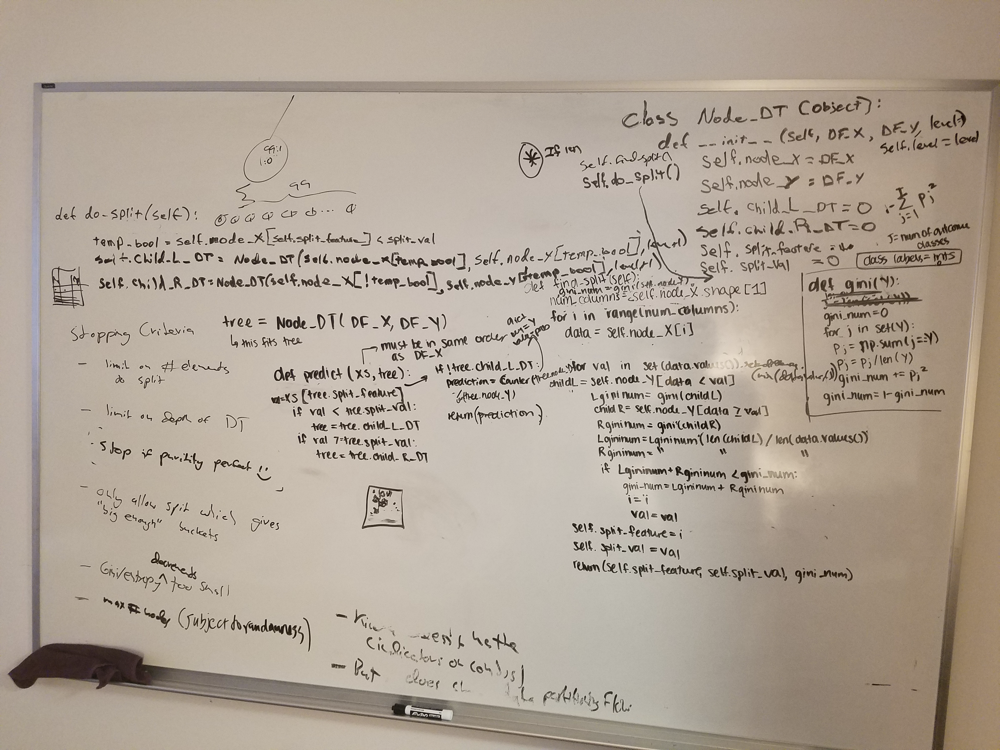

In [1]:
import numpy as np
import pandas as pd

import pdb

### The following Class needs stopping criteria:
- Code is broken: Infininite recurrsion loop right now: 
- Needs stopping criteria
- would be cool to pass an option of which type of criteria to use.
- Right now the code will traverse the left side until it hits a gini of 0, it then goes to the righ, but then goes into an endless loop. 

#### Stopping Criteria:
    1. limit on # elements of split
    2. limit on depth of DT
    3. stop if purity is perfect :)
    4. only allow split that gives big enough buckets
    5. gini/entropy decreased too small
    6. max number of body (subject to randomness)

In [12]:
# My Decision Tree algorithm class leaf node
class Node_DT(object):
    def __init__ (self, DF_x, DF_y, level=0):
        self.node_x = DF_x
        self.node_y = DF_y
        self.level = level
        self.child_L_DT = 0
        self.child_R_DT = 0
        self.split_feature = 0
        self.split_val = 0
        self.find_split()
        self.do_split()
                    

    def find_split(self):
        pdb.set_trace()
        
        gini_num = self.gini(self.node_y)
        print(gini_num)
        
        num_features = self.node_x.shape[1]
        for i in range(num_features):
            feature_data = self.node_x[:,i]
            for val in set(feature_data):
                child_L = self.node_y[feature_data < val]
                L_gini_num = self.gini(child_L)
                child_R = self.node_y[feature_data >= val]
                R_gini_num = self.gini(child_R)
                
                if L_gini_num + R_gini_num < gini_num:
                    gini_num = L_gini_num + R_gini_num
                    self.split_feature = i
                    self.split_val = val

    def gini(self, y):
        gini_num = 0
        # j = number of outcomes / classes
        for j in set(y):
            pj = np.sum(j==y)
            pj = pj/len(y)
            gini_num += pj * (1-pj)
        return(gini_num)
        
    def do_split(self):
        print("self.level ", self.level)
        pdb.set_trace()
        
        temp_bool = self.node_x[:,self.split_feature] < self.split_val
        print("creating left leaf")
        if len(temp_bool):
            self.child_L_DT = Node_DT(self.node_x[temp_bool], self.node_y[temp_bool], self.level+1 )
            print("creating right leaf")
            pdb.set_trace()
        # using the ~ tilde in front of a np.array of booleans will convert each one to its opposit. 
        ## so true becomes false and vice versa.
        if len(~temp_bool):
            self.child_R_DT = Node_DT(self.node_x[~temp_bool], self.node_y[~temp_bool], self.level+1 )
        
# remove print statements. they are used for debugging.        

In [13]:
# Importing the dataset
dataset = pd.read_csv('dataset/Social_Network_Ads.csv')
X = dataset.iloc[:, [2, 3]].values
y = dataset.iloc[:, 4].values

# originally when whiteboarding the solution, we were going to use dataframes, 
## but np.arrays are working fine for now. 
# DF_X = X
# DF_Y = y

## Create Tree 
tree = Node_DT(X, y)  ## this fits the tree


> <ipython-input-12-066ba9652775>(18)find_split()
-> gini_num = self.gini(self.node_y)
(Pdb) c
0.4593875
self.level  0
> <ipython-input-12-066ba9652775>(55)do_split()
-> temp_bool = self.node_x[:,self.split_feature] < self.split_val
(Pdb) c
creating left leaf
> <ipython-input-12-066ba9652775>(18)find_split()
-> gini_num = self.gini(self.node_y)
(Pdb) c
0.443865744645
self.level  1
> <ipython-input-12-066ba9652775>(55)do_split()
-> temp_bool = self.node_x[:,self.split_feature] < self.split_val
(Pdb) c
creating left leaf
> <ipython-input-12-066ba9652775>(18)find_split()
-> gini_num = self.gini(self.node_y)
(Pdb) c
0.43527616808
self.level  2
> <ipython-input-12-066ba9652775>(55)do_split()
-> temp_bool = self.node_x[:,self.split_feature] < self.split_val
(Pdb) c
creating left leaf
> <ipython-input-12-066ba9652775>(18)find_split()
-> gini_num = self.gini(self.node_y)
(Pdb) c
0
self.level  3
> <ipython-input-12-066ba9652775>(55)do_split()
-> temp_bool = self.node_x[:,self.split_feature] < s

(Pdb) c
0
self.level  15
> <ipython-input-12-066ba9652775>(55)do_split()
-> temp_bool = self.node_x[:,self.split_feature] < self.split_val
(Pdb) c
creating left leaf
creating right leaf
> <ipython-input-12-066ba9652775>(63)do_split()
-> if len(~temp_bool):
(Pdb) q


BdbQuit: 

In [28]:
# debugging and playing with gini code. 
# throw this away when ready to clean up notebook
def gini2(y):
    gini_num = 0
    # j = number of outcomes / classes
    for j in set(y):
        prob = np.sum(j==y)
        print(prob)
        prob = prob/len(y)
        gini_num += prob * (1-prob)
#         gini_num = 1- gini_num
    return(gini_num)